<h1>Task2 Visualise the Dataset</h1>

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter
from pathlib import Path
import seaborn as sns
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn import tree
import scipy
from scipy.stats import norm
from scipy import stats
import statsmodels.api as sm
import forestci as fci
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import HoverTool, GeoJSONDataSource, LinearColorMapper, ColorBar, Select,PrintfTickFormatter
import json
from bokeh.palettes import RdYlGn
from bokeh.io import output_file, save

<h2>Task 2-1 Considering Age<h2>

<h3>Correlation<h3>

In [26]:
# Load Bourough data
df_bourough = pd.read_csv(Path.cwd() / "data" / "year_borough_grocery.csv")
df_bourough.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,...,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km
0,E09000001,323.174750,35.0,150.0,250.0,400.0,1000.0,323.692596,1.001520,98.842963,...,103883,6687.0,3697.0,2990.0,1018.0,4349.0,1320.0,43.910124,2.90,2305.862069
1,E09000002,421.304125,32.5,165.6,300.0,500.0,1500.0,597.994271,0.828993,122.341294,...,397127,203101.0,99442.0,103659.0,60281.0,123180.0,19640.0,33.017321,36.09,5627.625381
2,E09000003,407.170491,40.0,180.0,320.0,500.0,1160.0,443.644324,0.171615,114.933771,...,4131210,378778.0,186357.0,192421.0,88754.0,237036.0,52988.0,37.195582,86.76,4365.813739
3,E09000004,359.544126,30.0,144.0,255.0,450.0,1000.0,476.576945,0.819748,106.446426,...,380177,242387.0,116814.0,125573.0,56028.0,146237.0,40122.0,38.880749,60.58,4001.105976
4,E09000005,434.324141,40.0,175.0,325.0,500.0,1500.0,616.087316,0.354492,128.930369,...,2541113,323443.0,163939.0,159504.0,75033.0,211885.0,36525.0,35.766416,43.28,7473.267098


In [27]:
# Load Ward data
df_ward = pd.read_csv(Path.cwd() / "data" / "year_osward_grocery.csv")
df_ward.head()

,area_id,weight,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,weight_ci95,volume,...,man_day,population,male,female,age_0_17,age_18_64,age_65+,avg_age,area_sq_km,people_per_sq_km
0,E05000026,449.535137,32.5,166.4,300.0,500.0,1500.0,771.349423,3.716832,125.960833,...,37315,14370.0,7469.0,6901.0,4211.0,9421.0,738.0,29.572999,1.26,11404.761905
1,E05000027,413.130263,32.5,150.0,300.0,500.0,1500.0,626.395178,5.164174,110.664114,...,14474,10845.0,5228.0,5617.0,3205.0,6608.0,1032.0,33.568004,1.36,7974.264706
2,E05000028,407.100472,32.5,160.0,300.0,500.0,1200.0,545.890959,2.710677,121.990710,...,32138,13856.0,6750.0,7106.0,4180.0,8537.0,1139.0,32.032693,1.29,10741.085271
3,E05000029,384.173858,30.0,150.0,250.0,454.0,1500.0,591.837557,4.968373,122.245578,...,16223,10850.0,5300.0,5550.0,3023.0,6251.0,1576.0,36.004793,3.38,3210.059172
4,E05000030,356.882607,30.0,140.0,250.0,450.0,1000.0,465.284180,3.880963,109.959688,...,17522,11348.0,5515.0,5833.0,2747.0,6961.0,1640.0,37.247444,3.45,3289.275362


In [28]:
#Calculate younger's ratio (%)
df_bourough["youth_ratio"] = df_bourough["age_0_17"]/(df_bourough["age_0_17"]+df_bourough["age_18_64"]+df_bourough["age_65+"])*100
df_ward["youth_ratio"]     = df_ward["age_0_17"]/(df_ward["age_0_17"]+df_ward["age_18_64"]+df_ward["age_65+"])*100

#Pick up columns
columns = [a for a in df_bourough if (a.startswith("f_") and not ('energy' in a) and not('weight' in a))]
columns.insert(0, "area_id")
columns.extend(["youth_ratio","representativeness_norm"])
data_bourough = df_bourough[columns]
data_ward     = df_ward[columns]

#create a food category list
food_categ = columns[1:-2]

#Create food category labels 
labels = ['Beer', 'Dairy', 'Eggs', 'Fats Oils', 'Fish', 'Fruit Veg', 'Grains', 'Red meat', 
'Poultry', 'Readymade', 'Sauces', 'Soft drinks', 'Spirits', 'Sweets', 'Tea coffee', 'Water', 'Wine']

In [29]:
# Define Correration function
def Compute_Correlation(df,param, categories=food_categ):
  rho_values = []
  p_values = []
  Category = []
  for cat in categories:
    correl, p_value = stats.spearmanr(df[cat],df[param])
    rho_values.append(correl)
    p_values.append(p_value)
    Category.append(cat)
    correlation_df = pd.DataFrame({'Category1':Category,'R':rho_values,'p':p_values,'statistically_significant':[ p < 0.05 for p in p_values]})
  return correlation_df


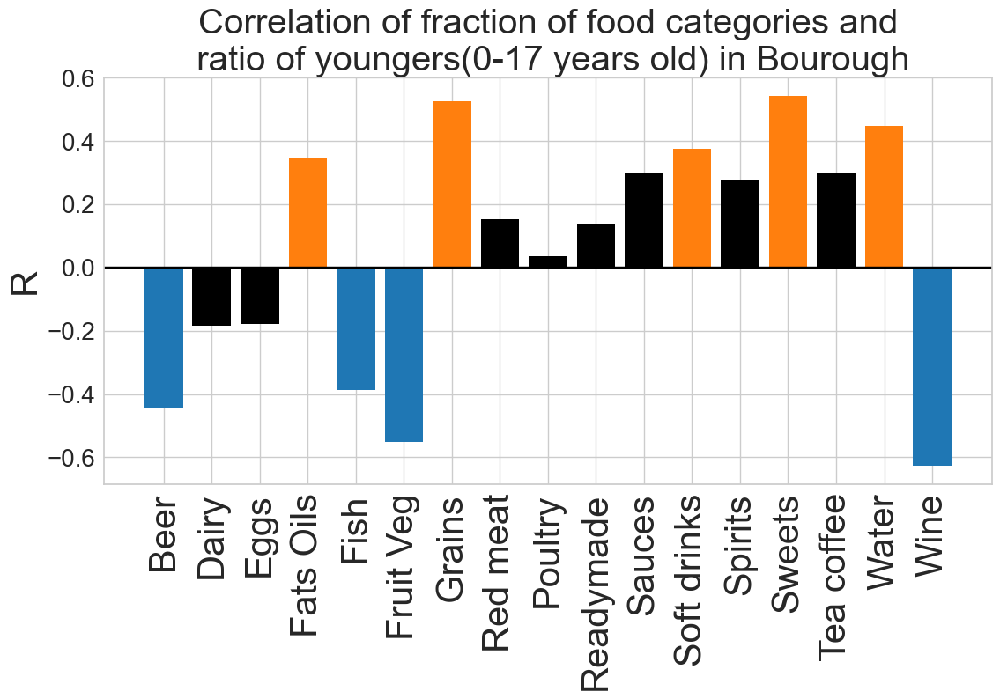

In [30]:
# Correration in Bourough
Corr_bourough = Compute_Correlation(df=data_bourough,param="youth_ratio")
fig = plt.figure(figsize=(13,6))
plt.title('Correlation of fraction of food categories and\n ratio of youngers(0-17 years old) in Bourough', fontsize=29)
plt.bar(Corr_bourough.Category1, Corr_bourough.R, color = ['black' if not v[3] else'tab:orange' if v[1] > 0 else 'tab:blue' for v in Corr_bourough.values])
plt.xticks(Corr_bourough.Category1,labels, rotation="vertical",fontsize=30)
plt.tick_params(axis='y', labelsize=20)
plt.axhline(y=0,color='black')
plt.ylabel('R',fontsize=30)
plt.show()

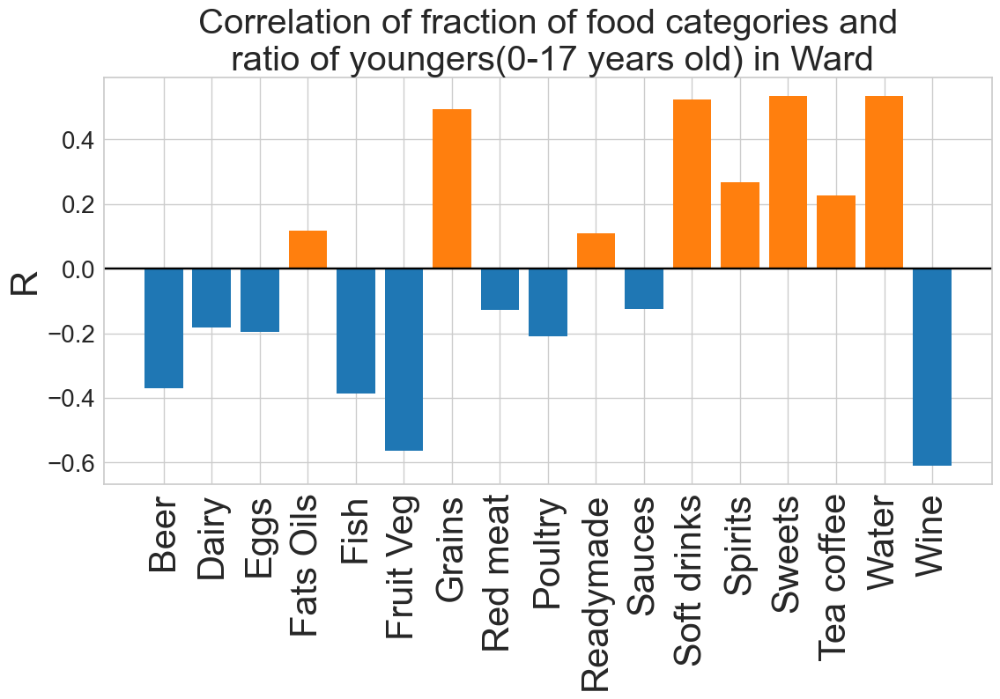

In [31]:
# Correration in Ward
Corr_ward = Compute_Correlation(df=data_ward,param="youth_ratio")
fig = plt.figure(figsize=(13,6))
plt.title('Correlation of fraction of food categories and\n ratio of youngers(0-17 years old) in Ward', fontsize=29)
plt.bar(Corr_ward.Category1, Corr_ward.R, color = ['black' if not v[3] else'tab:orange' if v[1] > 0 else 'tab:blue' for v in Corr_ward.values])
plt.xticks(Corr_ward.Category1,labels, rotation="vertical",fontsize=30)
plt.tick_params(axis='y', labelsize=20)
plt.axhline(y=0,color='black')
plt.ylabel('R',fontsize=30)
plt.show()

<h3>Coropleth map for Young Tesco users<h3>

In [32]:
# Load the geographical coordinates of London
fp_borough = Path.cwd() / "statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp"
fp_ward = Path.cwd() / "London-wards-2018/London-wards-2018_ESRI/London_Ward.shp"
gdf_borough = gpd.read_file(fp_borough)
gdf_ward = gpd.read_file(fp_ward)

# Merge shp file and grocery data
join_borough = gdf_borough.join(data_bourough.set_index('area_id'), on = 'GSS_CODE', how = 'left')
join_ward = gdf_ward.join(data_ward.set_index('area_id'), on = 'GSS_CODE', how = 'left')

# Create a column of percentage of representativeness_norm
join_borough["representativeness_norm_per"] = join_borough["representativeness_norm"]*100
join_ward["representativeness_norm_per"] = join_ward["representativeness_norm"]*100

join_borough.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,f_beer,f_dairy,...,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,youth_ratio,representativeness_norm,representativeness_norm_per
0,Kingston upon Thames,E09000021,3726.117,0.000,F,NaN,NaN,"POLYGON ((516401.600 160201.800, 516407.300 16...",0.018333,0.094369,...,0.011539,0.032124,0.003200,0.172448,0.006039,0.025765,0.015595,21.871813,0.000000,0.000000
1,Croydon,E09000008,8649.441,0.000,F,NaN,NaN,"POLYGON ((535009.200 159504.700, 535005.500 15...",0.014641,0.099640,...,0.013652,0.039888,0.003607,0.172795,0.006453,0.037988,0.015095,24.512853,0.213148,21.314780
2,Bromley,E09000006,15013.487,0.000,F,NaN,NaN,"POLYGON ((540373.600 157530.400, 540361.200 15...",0.019327,0.096956,...,0.013160,0.035204,0.003032,0.179765,0.005713,0.028668,0.020766,22.187315,0.172818,17.281806
3,Hounslow,E09000018,5658.541,60.755,F,NaN,NaN,"POLYGON ((521975.800 178100.000, 521967.700 17...",0.014150,0.105080,...,0.013023,0.028579,0.003298,0.165895,0.006365,0.026237,0.016364,23.403225,0.126128,12.612824
4,Ealing,E09000009,5554.428,0.000,F,NaN,NaN,"POLYGON ((510253.500 182881.600, 510249.900 18...",0.014243,0.115131,...,0.014388,0.023124,0.003230,0.146897,0.006160,0.025098,0.016891,23.590049,0.519101,51.910055


In [33]:
join_ward.head()

,NAME,GSS_CODE,DISTRICT,LAGSSCODE,HECTARES,NONLD_AREA,geometry,f_beer,f_dairy,f_eggs,...,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,youth_ratio,representativeness_norm,representativeness_norm_per
0,Chessington South,E05000405,Kingston upon Thames,E09000021,755.173,0.0,"POLYGON ((516401.596 160201.802, 516407.302 16...",0.023747,0.086161,0.005975,...,0.010706,0.030752,0.003033,0.219604,0.004246,0.028357,0.012010,23.491852,0.128768,12.876767
1,Tolworth and Hook Rise,E05000414,Kingston upon Thames,E09000021,259.464,0.0,"POLYGON ((519552.998 164295.600, 519508.096 16...",0.035398,0.081787,0.007156,...,0.007380,0.045046,0.005367,0.192422,0.004760,0.030957,0.011821,23.227123,0.127720,12.771954
2,Berrylands,E05000401,Kingston upon Thames,E09000021,145.390,0.0,"POLYGON ((518107.499 167303.399, 518114.301 16...",0.015855,0.078378,0.006844,...,0.010310,0.028619,0.001935,0.161839,0.005834,0.023306,0.015797,19.303667,0.107403,10.740268
3,Alexandra,E05000400,Kingston upon Thames,E09000021,268.506,0.0,"POLYGON ((520336.700 165105.498, 520332.198 16...",0.016169,0.102969,0.006146,...,0.008573,0.039807,0.007249,0.175712,0.006524,0.027704,0.015759,23.747277,0.162876,16.287649
4,Beverley,E05000402,Kingston upon Thames,E09000021,187.821,0.0,"POLYGON ((521201.203 169275.505, 521204.303 16...",0.020888,0.093909,0.008142,...,0.010618,0.047964,0.005928,0.184388,0.005602,0.026208,0.019716,23.568898,0.190692,19.069155


In [34]:
# Set min and max
min_y_borough = min(list(filter(lambda a : a != 'Nan', join_borough["youth_ratio"].values)))
max_y_borough = max(list(filter(lambda a : a != 'Nan', join_borough["youth_ratio"].values)))
min_y_ward = min(list(filter(lambda a : a != 'Nan', join_ward["youth_ratio"].values)))
max_y_ward = max(list(filter(lambda a : a != 'Nan', join_ward["youth_ratio"].values)))

palette = RdYlGn[10]

In [35]:
def Json(data):
  # Read data to json.
  merged = json.loads(data.to_json())

  # Convert to String like object.
  json_data = json.dumps(merged)

  return json_data

In [36]:
def Choropleth_map(data,title,item,min,max):
    
    color_mapper = LinearColorMapper(palette = palette, low = min, high = max, nan_color = 'gray')
    
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, border_line_color=None, location = (0,0),
                orientation = 'vertical', formatter=PrintfTickFormatter(format="%s"),
                major_label_text_font_size='20pt')
    hover = HoverTool(tooltips = [('Region','@NAME'),("Youngers", '@'+ item+'%')])


    p = figure(title = title, width=900, height=600, toolbar_location = None, tools = [hover])
    p.title.text_font = 'helvetica'
    p.title.text_font_style = 'bold'
    p.title.text_font_size = '30px'
    p.title.align = 'center'
    
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    # Create a new GeoJSONDataSource object for this figure
    geosource = GeoJSONDataSource(geojson = data)
    
    #Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource,fill_color = {'field' :item, 'transform' : color_mapper},
            line_color = 'black', line_width = 0.5, fill_alpha = 1)
    
    #Specify figure layout.
    p.add_layout(color_bar, 'right')
    
    #Display figure inline in Jupyter Notebook.
    p.xaxis.visible = False
    p.yaxis.visible = False
    return p

In [37]:
# Create Json files
json_borough = Json(join_borough)
json_ward = Json(join_ward)

y_borough = Choropleth_map(json_borough,"Ratio of Youngers (0-17years old) in Borough[%]", "youth_ratio", min_y_borough, max_y_borough)
y_ward = Choropleth_map(json_ward,"Ratio of Youngers (0-17years old) in Ward[%]", "youth_ratio", min_y_ward, max_y_ward)

output_notebook()
show(y_borough)
show(y_ward)

# save each document separately
output_file("y_borough.html")
save(y_borough)
output_file("y_ward.html")
save(y_ward)

Loading BokehJS ...

'/Users/toyamakengo/Desktop/UoB/Applied Data Science/Sem2/Coursework/y_ward.html'

<h3>ML modeling</h3>

In [38]:
# Linear Regression
def linear_regression(X_train, y_train, X_test, y_test):
    linear_model = LinearRegression()
    linear_model = linear_model.fit(X_train, y_train)
    linear_model_prediction = linear_model.predict(X_test)

    print(f"Mean squared error: {mean_squared_error(y_test, linear_model_prediction):.3f}")
    print(f"R2 score: {r2_score(y_test, linear_model_prediction):.3f}")
    print(f"coefs {linear_model.coef_}")
    return linear_model_prediction


# Ridge model
def ridge_model(X_train, y_train, X_test, y_test):
    alphas = np.arange(0.1, 10, 0.1)
    best_r2_score_ridge = -99
    mse_score_related_ridge = 0
    best_alpha = 0


    for alpha in alphas:
        ridge_model = linear_model.Ridge(alpha=alpha)
        ridge_model.fit(X_train, y_train)
        ridge_model_prediction = ridge_model.predict(X_test)
        r2 = r2_score(y_test, ridge_model_prediction)
        mse = mean_squared_error(y_test, ridge_model_prediction)
        if r2 > best_r2_score_ridge:
            best_r2_score_ridge = r2
            mse_score_related_ridge = mse
            best_alpha = alpha

    print(f"A ridge model obtain the best r2 score when the lasso alpha is {best_alpha}. The r2 score is {best_r2_score_ridge:.3f} and the related mse score is {mse_score_related_ridge:.3f}")
    
def svm_model(X_train, y_train, X_test, y_test):
    svm_model = svm.SVR()
    svm_model = svm_model.fit(X_train, y_train)
    svm_model_prediction = svm_model.predict(X_test)

    print(f"SVM: Mean squared error: {mean_squared_error(y_test, svm_model_prediction):.3f}")
    print(f"SVM: R2 score: {r2_score(y_test, svm_model_prediction):.3f}")

    
def tree_model(X_train, y_train, X_test, y_test):
    tree_model = tree.DecisionTreeRegressor()
    tree_model = tree_model.fit(X_train, y_train)
    tree_model_prediction = tree_model.predict(X_test)

    print(f"Decision Tree: Mean squared error: {mean_squared_error(y_test, tree_model_prediction):.3f}")
    print(f"Decision Tree: R2 score: {r2_score(y_test, tree_model_prediction):.3f}")

def GBR_model(X_train, y_train, X_test, y_test):
    GBR_model = GradientBoostingRegressor(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
    GBR_model = GBR_model.fit(X_train, y_train)
    GBR_model_prediction = GBR_model.predict(X_test)

    print(f"Gradient Boosting Regressor: Mean squared error: {mean_squared_error(y_test, GBR_model_prediction):.3f}")
    print(f"Gradient Boosting Regressor::R2 score: {r2_score(y_test, GBR_model_prediction):.3f}")
    
def ADA_model(X_train, y_train, X_test, y_test):
    R2_pre = -99999
    n_est = 1000
    for n in [50,100,150,200,250]:
        ADA_model = AdaBoostRegressor(n_estimators = n, random_state = 0)
        ADA_model = ADA_model.fit(X_train, y_train)
        Y_pred = ADA_model.predict(X_test)
        R2_score = r2_score(y_test,Y_pred)
        MSE = mean_squared_error(y_test,Y_pred)
        if R2_score > R2_pre:
            R2_pre = R2_score
            n_est = n
    print(f"ADA: Mean squared error: {mean_squared_error(y_test, Y_pred):.3f}")
    print("ADA: R2 score:",R2_pre)
    print("ADA:n_estimators is",n_est)

# Evaluate the Random Forest model    
def Random_forest(X_train, y_train, X_test, y_test):
    R2_pre = -99999
    n_est = 1000
    for n in [50,100,150,200,250]:
        regressor = RandomForestRegressor(n_estimators = n, random_state = 0)
        regressor.fit(X_train, y_train)
        Y_pred = regressor.predict(X_test)
        R2_score = r2_score(y_test,Y_pred)
        MSE = mean_squared_error(y_test,Y_pred)
        if R2_score > R2_pre:
            R2_pre = R2_score
            n_est = n
    print("Random Forest:Mean Square Error is",MSE)
    print("Random Forest:R2 Score is",R2_pre)
    print("Random Forest:n_estimators is",n_est)
    

In [39]:

X = data_ward[food_categ]
Y = data_ward["youth_ratio"].astype(float)

X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

linear_regression(X_train, y_train, X_test, y_test)
ridge_model(X_train, y_train, X_test, y_test)
svm_model(X_train, y_train, X_test, y_test)
tree_model(X_train, y_train, X_test, y_test)
GBR_model(X_train, y_train, X_test, y_test)
ADA_model(X_train, y_train, X_test, y_test)
Random_forest(X_train, y_train, X_test, y_test)

Mean squared error: 9.899
R2 score: 0.483
coefs [9.43391679e+12 1.69766876e+13 3.86450410e+12 8.95848855e+12
 6.91750003e+12 5.10551845e+13 2.57787690e+13 1.30036682e+13
 4.72522957e+12 2.32837889e+13 4.21765218e+12 1.34662691e+13
 1.59631518e+12 3.26134714e+13 1.64100849e+12 1.04654143e+13
 9.60110661e+12]
A ridge model obtain the best r2 score when the lasso alpha is 9.9. The r2 score is 0.488 and the related mse score is 9.796
SVM: Mean squared error: 8.474
SVM: R2 score: 0.557
Decision Tree: Mean squared error: 14.528
Decision Tree: R2 score: 0.241
Gradient Boosting Regressor: Mean squared error: 11.307
Gradient Boosting Regressor::R2 score: 0.409
ADA: Mean squared error: 7.898
ADA: R2 score: 0.59786772448709
ADA:n_estimators is 100
Random Forest:Mean Square Error is 7.450521771799925
Random Forest:R2 Score is 0.6107763615986672
Random Forest:n_estimators is 250


<h3>Random Forest</h3>

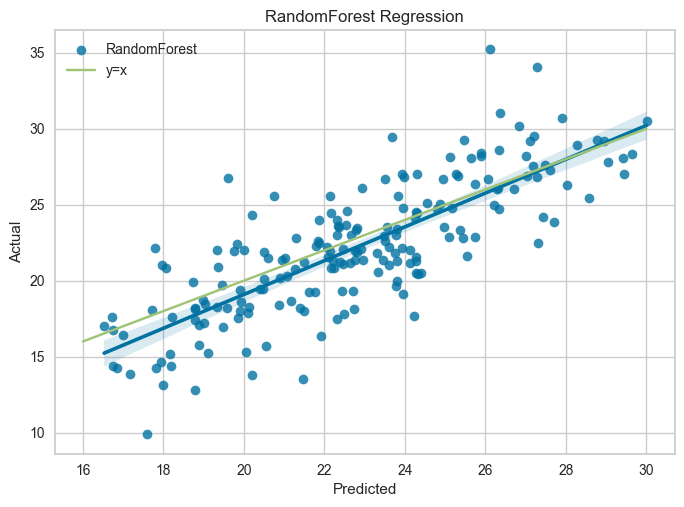

In [40]:
rf = RandomForestRegressor(n_estimators = 150, random_state = 0)
rf.fit(X_train,y_train)
y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)
sns.regplot(x=y_pred_test, y=y_test, label='RandomForest')
plt.plot([16,30], [16,30], label='y=x')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("RandomForest Regression")
plt.legend()
plt.show()

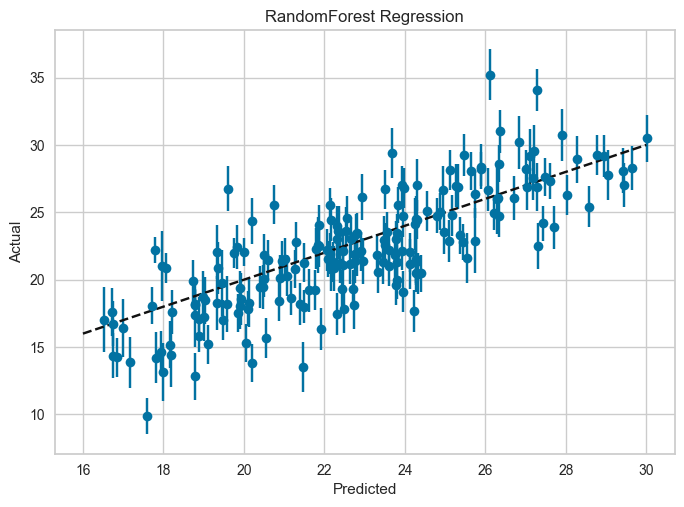

In [41]:
# Calculate the variance
X_train_array = np.array(X_train)
X_test_array = np.array(X_test)
rf_unbiased = fci.random_forest_error(rf, X_train_array, X_test_array)

# Plot error bars for predicted MPG using unbiased variance
plt.errorbar(y_pred_test, y_test, yerr=np.sqrt(rf_unbiased), fmt='o')
plt.plot([16, 30], [16, 30], 'k--')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("RandomForest Regression")
plt.show()

<h3>Residual plot</h3>

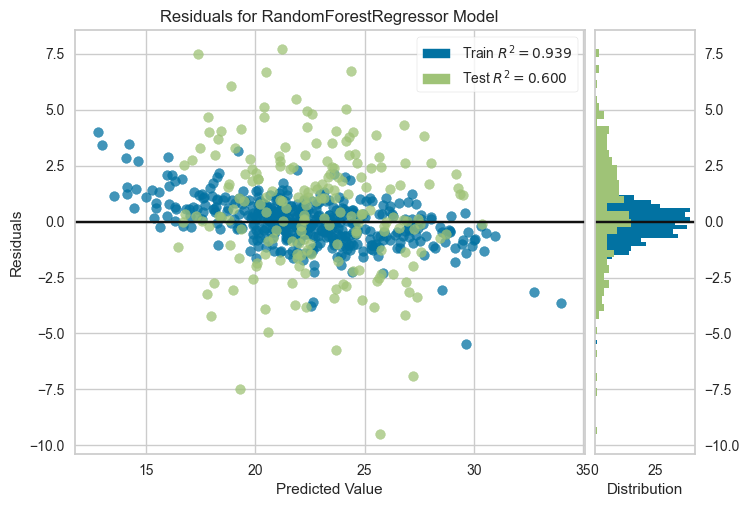

In [42]:
from yellowbrick.regressor import residuals_plot
# Create the visualizer, fit, score, and show it
viz = residuals_plot(RandomForestRegressor(n_estimators=150), X_train, y_train, X_test, y_test)

<h2>Task 2-2 Representativeness<h2>

In [43]:
# Set min and max
min_r_borough = min(list(filter(lambda a : a != 'Nan', join_borough["representativeness_norm_per"].values)))
max_r_borough = max(list(filter(lambda a : a != 'Nan', join_borough["representativeness_norm_per"].values)))
min_r_ward = min(list(filter(lambda a : a != 'Nan', join_ward["representativeness_norm_per"].values)))
max_r_ward = max(list(filter(lambda a : a != 'Nan', join_ward["representativeness_norm_per"].values)))

In [44]:
r_borough = Choropleth_map(json_borough,"Representativeness in Borough [%]", "representativeness_norm_per", min_r_borough, max_r_borough)
r_ward = Choropleth_map(json_ward,"Representativeness in Ward[%]", "representativeness_norm_per", min_r_ward, max_r_ward)

output_notebook()
show(r_borough)
show(r_ward)

# save each document separately
output_file("r_borough.html")
save(r_borough)
output_file("r_ward.html")
save(r_ward)

Loading BokehJS ...

'/Users/toyamakengo/Desktop/UoB/Applied Data Science/Sem2/Coursework/r_ward.html'

<h1>Task3 <h1>

<h2>1. Preliminary Analysis<h2>

In [45]:
income = pd.read_excel(Path.cwd() / "regionalgrossdisposablehouseholdincomelocalauthoritytlilondon2020.xls",sheet_name="Table 2", header=1)
income.head()

,Region,LAD code,Region name,1997,1998,1999,2000,2001,2002,2003,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,London,E09000001,City of London,90955,100333,93408,99183,97691,99214,104460,...,148259,179835,218893,226637,227911,217301,214667,208106,179272,147813
1,London,E09000007,Camden,16075,17822,19004,21065,20960,20976,21301,...,31706,34063,37391,37995,40397,40774,41510,44243,44009,41810
2,London,E09000033,Westminster,20955,21757,23748,25781,26160,25842,26303,...,39513,42779,46942,49486,52695,53894,53729,54284,52926,48382
3,London,E09000013,Hammersmith and Fulham,21077,21234,22403,24194,24179,23595,24404,...,32539,34811,38925,41268,42654,41819,42608,44109,43730,43998
4,London,E09000020,Kensington and Chelsea,34846,34560,35735,38233,37352,36662,37258,...,56104,62152,68981,74087,77467,76952,78689,84897,82283,79325


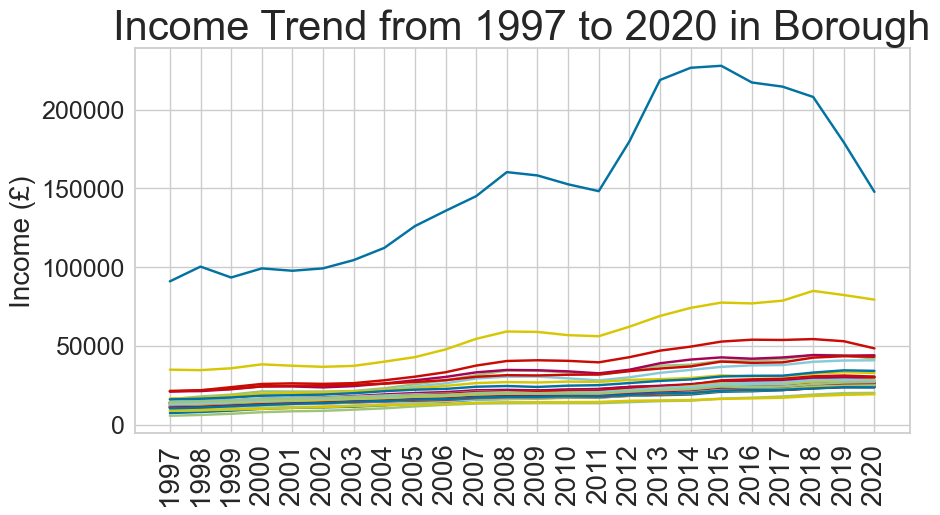

In [46]:
# Plot the line graph
fig, ax = plt.subplots(1, figsize=(10, 5))

years = list(range(1997, 2021))
years = [str(year) for year in years]

for i in range(len(income)):
  ax.plot(pd.DataFrame(income.iloc[i][years]))

ax.set_xticks(range(len(years)))
ax.set_xticklabels(labels=years, rotation=90, fontsize=20)
ax.tick_params(axis='y', labelsize=18)

ax.set_title('Income Trend from 1997 to 2020 in Borough', fontsize=30)
# ax.set_xlabel('Years', fontsize=20)
ax.set_ylabel('Income (£)', fontsize=20)
ax.grid(visible=True, which='major')


<h2>2. Correlation of grocery and income<h2>

In [47]:
income_2015 = income[["LAD code","2015"]]
data_income = pd.merge(data_bourough,income_2015, left_on="area_id", right_on = 'LAD code', how = 'left').drop('LAD code',axis=1)
data_income = data_income.rename(columns={"2015":"Income"})
data_income.head()

,area_id,f_beer,f_dairy,f_eggs,f_fats_oils,f_fish,f_fruit_veg,f_grains,f_meat_red,f_poultry,...,f_sauces,f_soft_drinks,f_spirits,f_sweets,f_tea_coffee,f_water,f_wine,youth_ratio,representativeness_norm,Income
0,E09000001,0.026307,0.121101,0.011756,0.022851,0.021307,0.322872,0.122289,0.046465,0.018064,...,0.011381,0.021961,0.003293,0.139697,0.004958,0.022606,0.025985,15.223568,1.000000,227911
1,E09000002,0.010783,0.096583,0.011266,0.031448,0.020717,0.248116,0.157618,0.051076,0.020254,...,0.014344,0.037077,0.003822,0.179794,0.006770,0.039458,0.008913,29.680307,0.173377,16270
2,E09000003,0.011298,0.106467,0.012773,0.032430,0.024277,0.327326,0.132781,0.050390,0.020199,...,0.014555,0.023797,0.003019,0.141607,0.006141,0.029242,0.015634,23.431667,0.720439,28080
3,E09000004,0.012231,0.095073,0.008948,0.025275,0.017349,0.251681,0.170318,0.046667,0.020140,...,0.012818,0.031980,0.003100,0.172936,0.006770,0.031482,0.012945,23.115101,0.054966,21207
4,E09000005,0.010729,0.115018,0.012938,0.032990,0.020180,0.270670,0.157685,0.046171,0.020670,...,0.013811,0.031545,0.003703,0.161408,0.005914,0.037473,0.011597,23.198214,0.450625,23510


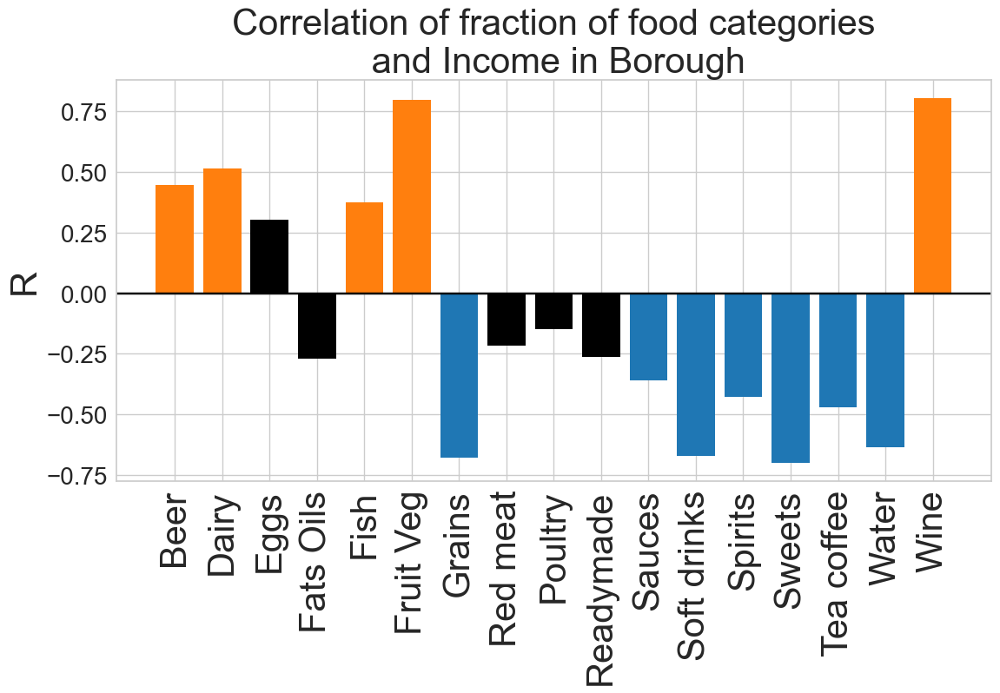

In [48]:
Corr_Income = Compute_Correlation(df=data_income,param="Income")
fig = plt.figure(figsize=(13,6))
plt.title('Correlation of fraction of food categories\n and Income in Borough', fontsize=30)
plt.bar(Corr_Income.Category1, Corr_Income.R, color = ['black' if not v[3] else'tab:orange' if v[1] > 0 else 'tab:blue' for v in Corr_Income.values])
plt.xticks(Corr_Income.Category1, labels, rotation="vertical",fontsize=30)
plt.tick_params(axis='y', labelsize=20)
plt.axhline(y=0,color='black')
plt.ylabel('R',fontsize=30)
plt.show()